In [42]:
import argparse
import os
from collections import defaultdict

import albumentations as A
import cv2
import numpy as np
import pandas as pd
import torch
import wandb
from albumentations.pytorch import ToTensorV2
from matplotlib import pyplot as plt
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torch import softmax

from src.models.regnety.regnety import RegNetY
from src.utils.class_mapping import load_class_mapping

# Define the configuration and paths

In [14]:
run_id = 'texcr5p8'
api = wandb.Api()
run = api.run(f'mvrcii_/SEER/{run_id}')
config = argparse.Namespace(**run.config)

rel_path = '../../../'
data_dir = '../../../../data'
csv_dir = '../../../../endoscopy/data_alpha'
ckpt_path = '../../../manual_checkpoints/autumn-sweep-2/autumn-sweep-2_epoch77_val_mAP_weighted0.82.ckpt'

# Load the dataset

In [15]:
df = pd.read_csv(os.path.join(csv_dir, 'train_val.csv'))
df.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13344 entries, 0 to 13343
Columns: 7 entries, dataset to fold
dtypes: float64(1), int64(1), object(5)
memory usage: 729.9+ KB


# Load the class mapping

In [16]:
class_mapping_path = os.path.join(rel_path, config.dataset_csv_path, 'class_mapping.json')
class_mapping = load_class_mapping(class_mapping_path)
class_mapping

{'angiectasia': 0,
 'angiodysplasia': 1,
 'barretts-esophagus': 2,
 'cancer': 3,
 'diverticulum': 4,
 'erythema': 5,
 'esophagitis': 6,
 'normal-mucosa': 7,
 'stenosis': 8,
 'submucosal-tumor': 9,
 'ulcer': 10,
 'varices': 11}

# Load the model

In [18]:
model = RegNetY.load_from_checkpoint(checkpoint_path=ckpt_path, config=config, class_to_idx=class_mapping)
model = model.eval()

target_layers = [model.backbone.s4.b1.conv3.conv]
for param in model.backbone.s4.b1.conv3.conv.parameters():
    param.requires_grad = True

Fine-tuning mode set to: FineTuneMode.HEAD


# Define the batch processing function

In [23]:
def transform(img):
    img_size = 224
    val_transforms = A.Compose([
        A.Resize(height=img_size, width=img_size, interpolation=2),
        A.CenterCrop(height=img_size, width=img_size, always_apply=True),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(always_apply=True)
    ])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    transformed = val_transforms(image=img)
    return transformed['image']

# Sample an image from every class

In [62]:
# Initialize collections and parameters
class_to_images, images, labels = defaultdict(list), [], []

for label, _ in class_mapping.items():
    if not (class_df := df[df['class'] == label]).empty:
        img_path = os.path.join(data_dir, class_df.sample(n=1).iloc[0]['frame_path'])
        tensor = transform(cv2.imread(img_path))
        class_to_images[label].append(tensor)
        images.append(tensor)
        labels.append(label)

image_tensor = torch.stack(images).to(model.device)
label_tensor = torch.tensor([list(class_mapping.keys()).index(label) for label in labels]).to(model.device)
label_tensor.shape, image_tensor.shape

(torch.Size([12]), torch.Size([12, 3, 224, 224]))

In [63]:
with torch.no_grad():
    logits, _ = model.forward(image_tensor)
    pred_indices = softmax(logits, dim=1).argmax(dim=1).cpu().numpy()

pred_labels = [list(class_mapping.keys())[idx] for idx in pred_indices]
labels = [list(class_mapping.keys())[idx] for idx in label_tensor.cpu().numpy()]

# Print the ground truth and predicted labels
for true_label, predicted_label in zip(labels, pred_labels):
    print(f'Ground Truth: {true_label:20} Predicted: {predicted_label}')

Ground Truth: angiectasia          Predicted: angiectasia
Ground Truth: angiodysplasia       Predicted: angiodysplasia
Ground Truth: barretts-esophagus   Predicted: stenosis
Ground Truth: cancer               Predicted: cancer
Ground Truth: diverticulum         Predicted: cancer
Ground Truth: erythema             Predicted: erythema
Ground Truth: esophagitis          Predicted: esophagitis
Ground Truth: normal-mucosa        Predicted: normal-mucosa
Ground Truth: stenosis             Predicted: stenosis
Ground Truth: submucosal-tumor     Predicted: erythema
Ground Truth: ulcer                Predicted: ulcer
Ground Truth: varices              Predicted: varices


# Class Activation Map (CAM)

In [129]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus

# grad_cam = GradCAM(model=model, target_layers=target_layers)
grad_cam = GradCAMPlusPlus(model=model, target_layers=target_layers)

In [130]:
def cam_for_class(original_img, img_tensor, true_idx, pred_idx):
    num_classes = len(class_mapping)
    
    total_images = num_classes
    cols = 6
    rows = (total_images + cols - 1) // cols
    
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 6))
    axes = axes.flatten()

    for idx, class_label in enumerate(class_mapping.keys()):
        cam_idx = idx
        targets = [ClassifierOutputTarget(cam_idx)]
        
        grayscale_cam = grad_cam(
            input_tensor=img_tensor.unsqueeze(0),
            targets=targets,
            aug_smooth=True, 
            eigen_smooth=True
        )[0, :]
        cam_image = show_cam_on_image(original_img, grayscale_cam, use_rgb=True, image_weight=0.5)

        ax = axes[idx]
        ax.imshow(cam_image)
        title = f'{class_label}'
        color = None
        if cam_idx == true_idx:
            title += ' (True)'
            color = 'green'
        if cam_idx == pred_idx:
            title += ' (Pred)'
            color = 'red'
        if cam_idx == true_idx and cam_idx == pred_idx:
            color = 'blue'
                
        for spine in ax.spines.values():
            if color:
                spine.set_visible(True)
                spine.set_edgecolor(color)
                spine.set_linewidth(4)
        
        ax.set_title(title, fontsize=14)  # Adjust fontsize as needed
        ax.set_xticks([])  # Remove x-axis ticks
        ax.set_yticks([])  # Remove y-axis ticks
        ax.set_xticklabels([])  # Ensure no tick labels are shown
        ax.set_yticklabels([])
    
    # Hide any unused axes if there are any
    for ax in axes[num_classes:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

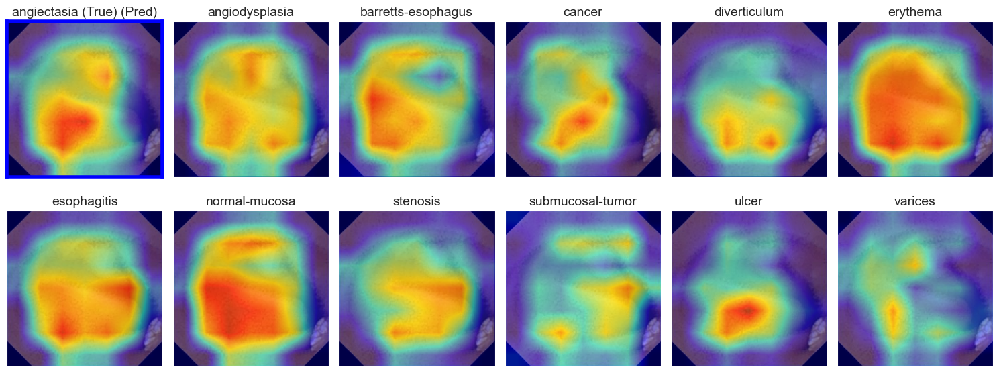

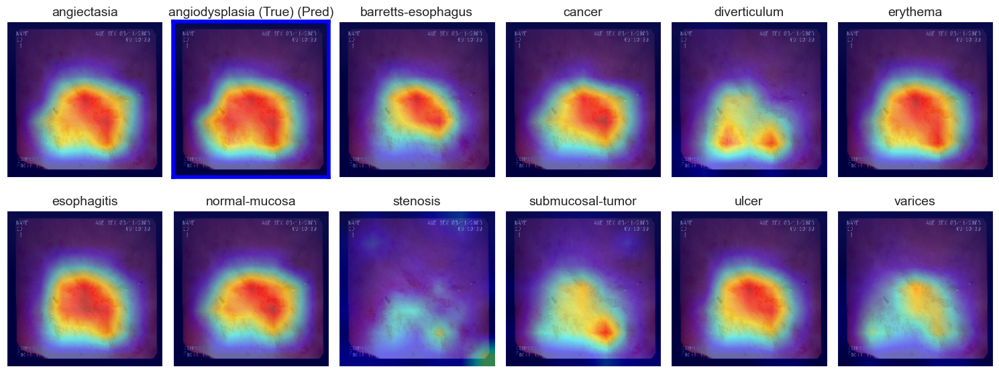

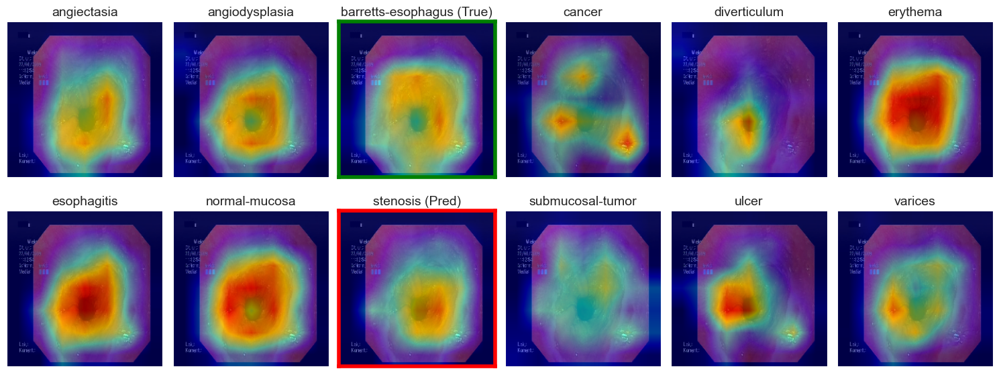

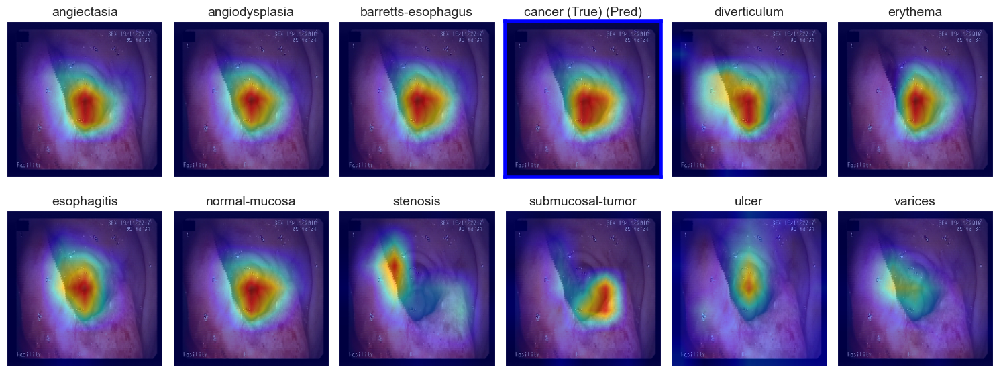

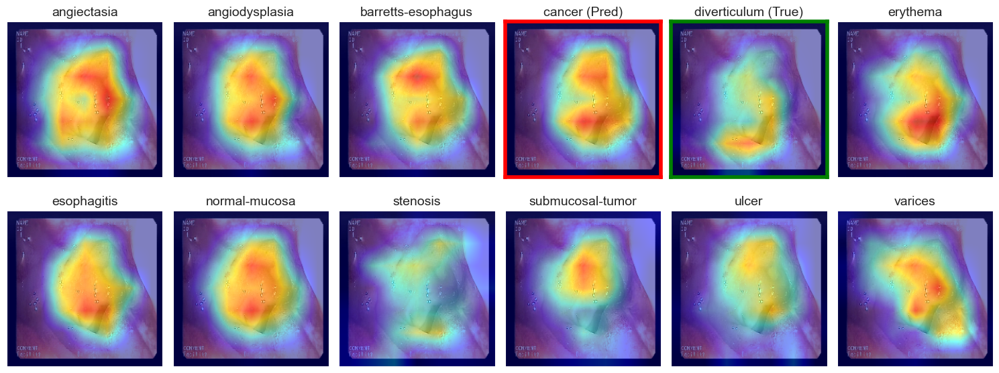

...

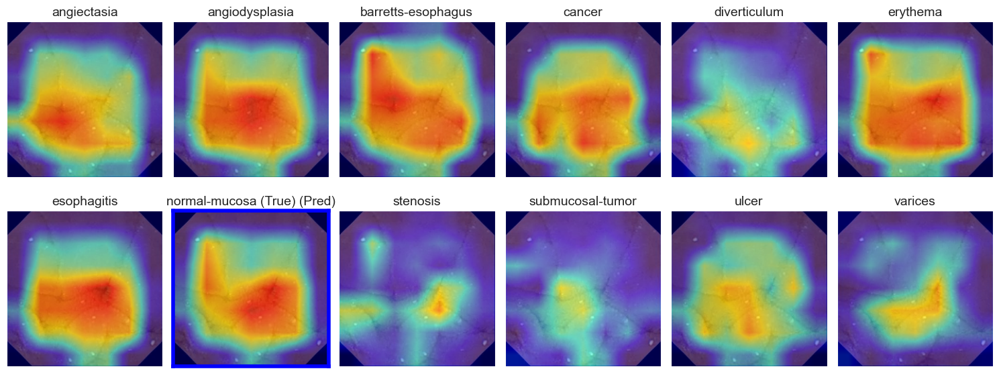

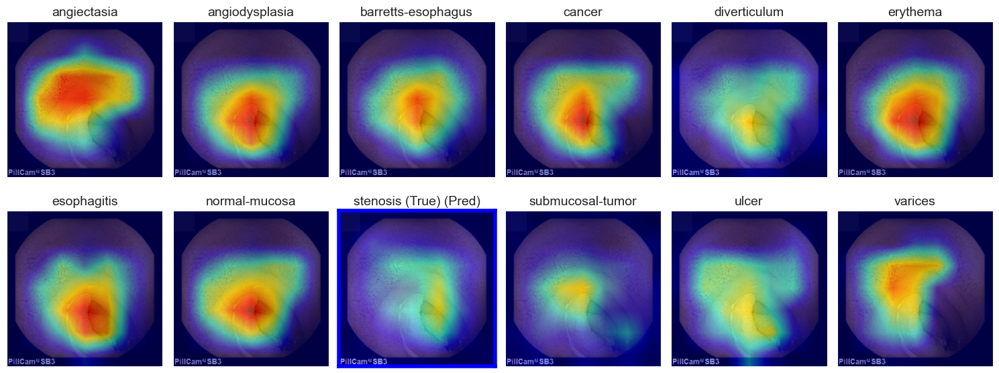

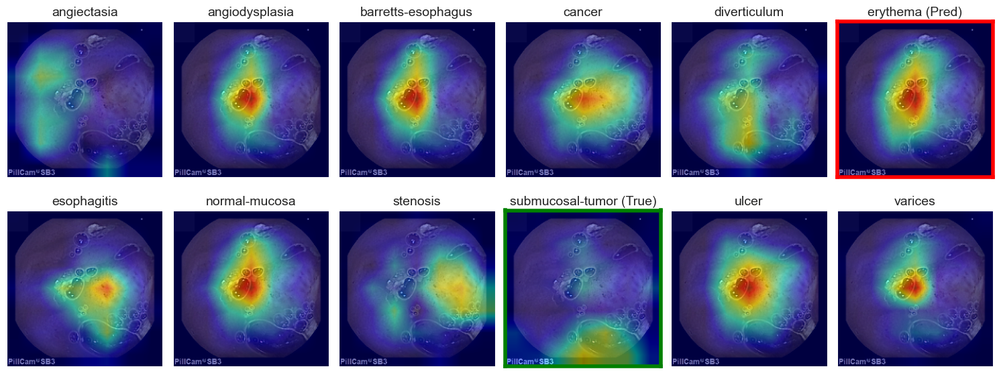

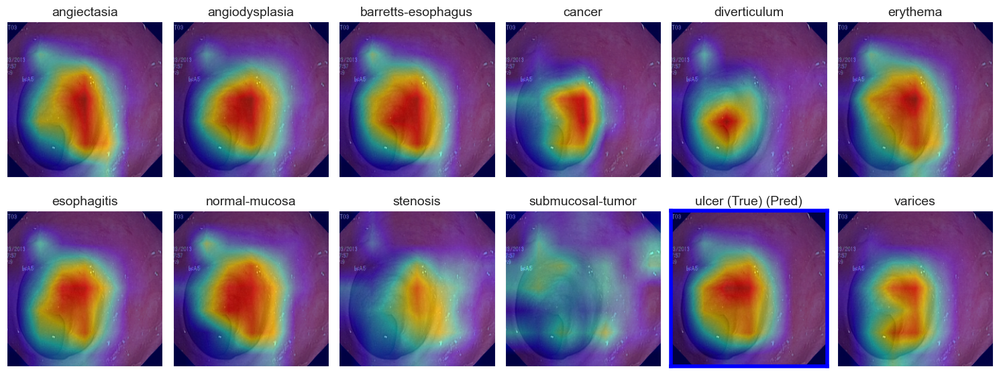

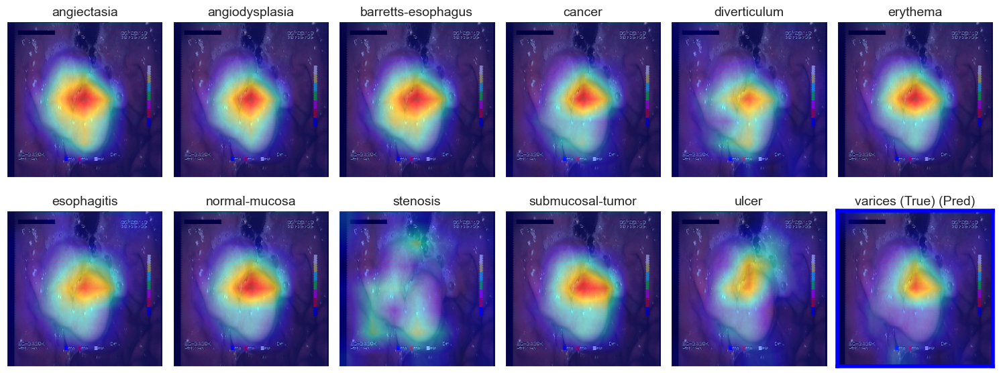

In [131]:
for sample_idx in range(len(images)):
    # Get the original image
    img_tensor = image_tensor[sample_idx]
    transposed_img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    unnormalized_img = (transposed_img * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    orig_img = np.clip(unnormalized_img, 0, 1)  # Original image

    pred_idx = pred_indices[sample_idx]  # Predicted class index
    true_idx = label_tensor[sample_idx]  # Actual class index (ground truth)

    cam_for_class(orig_img, img_tensor, true_idx=true_idx, pred_idx=pred_idx)